# *deepBreaks* applications
## *deepBreaks* identifies amino acids associated with color sensitivity  
In this study we are trying to use 175 amino-acid sequences to train predictive models for predicting a phenotype which is the the maximum wavelength absobption.  
After that, we use the top 3 models to study their feature importances and merge their results. We cover all three steps of preprocessing, modelling, and interpretaion of the models. Finally we vizualize the results of the models and prioritize the most imposrtant sites of the sequences.  
![alt text](../img/lite_mar/LITE_Mar.png)

In [1]:
# importing deepBreaks libraries 
from deepBreaks.utils import get_models, get_scores, get_params, make_pipeline, df_to_dict, imp_print, ref_id_type, report_test_scores, train_test_split
from deepBreaks.preprocessing import MisCare, ConstantCare, URareCare, CustomOneHotEncoder
from deepBreaks.preprocessing import FeatureSelection, CollinearCare, CustomStandardScaler
from deepBreaks.preprocessing import read_data, balanced_classes
from deepBreaks.models import model_compare_cv, finalize_top, importance_from_pipe, mean_importance, summarize_results
from deepBreaks.visualization import plot_scatter, dp_plot, plot_imp_model, plot_imp_all, visualize_reg, visualize_cl
import warnings
import datetime
import os

In [2]:
warnings.filterwarnings("ignore")
warnings.simplefilter('ignore')

In [71]:
# defining user params, file pathes, analysis type

#assign your path to folder containing all the datasplits
path = './vizphiz_data_splits_2024-05-02_16-58-09'
# path to sequences of interest
seqFileName = f'{path}/rod_aligned_VPOD_1.1_het.fasta' 
# path to corresponding metadata of interest
metaDataFileName = f'{path}/rod_meta.tsv' 

# name of the phenotype
mt = 'Lambda_Max'

# type of the sequences
seq_type = 'aa'

ana_type = 'reg'

seed = 123

In [72]:
# making a unique directory for saving the reports of the analysis
print('direcory preparation')
dt_label = datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
seqFile = seqFileName.split('.')[0]
report_dir = str(seqFile +'_' + mt + '_' + dt_label)
os.makedirs(report_dir)

direcory preparation


In [73]:
%%time
print('reading meta-data')
# importing metadata
meta_data = read_data(metaDataFileName, seq_type = None, is_main=False)

# importing sequences data
print('reading fasta file')
tr = read_data(seqFileName, seq_type = seq_type, is_main=True, gap_threshold=0.5)

# sequence data in dictionary format
raw_seq = df_to_dict(tr)
print('Shape of data is: ', tr.shape)


tr = tr.merge(meta_data.loc[:, mt],  left_index=True, right_index=True)
y = tr.loc[:, mt].values
tr.drop(mt, axis=1, inplace=True)
print('Shape of data is: ', tr.shape)

reading meta-data
reading fasta file
Shape of data is:  (396, 352)
Shape of data is:  (396, 352)
CPU times: total: 156 ms
Wall time: 158 ms


**Attention**: metadata and sequences data should have the names as their row names and for each sequence their must be a value in the meta data file.

In [74]:
print('metadata looks like this:')
meta_data.head()

metadata looks like this:


,Lambda_Max,Species,Opsin_Family,Phylum,Class,Accession,Mutations
Bovine,500.0,Bos_tarus,Rh1,Chordata,Mammalia,NM_001014890,NaN
S1,502.0,Neoniphon_sammara,Rh1,Chordata,Actinopteri,U57536.1,NaN
S2,502.0,Neoniphon_argenteus,Rh1,Chordata,Actinopteri,U57540.1,NaN
S3,481.0,Neoniphon_aurolineatus,Rh1,Chordata,Actinopteri,U57541.1,NaN
S4,494.0,Sargocentron_punctatissimum,Rh1,Chordata,Actinopteri,U57543.1,NaN


In [75]:
print('sequence data looks like this:')
tr.head()

sequence data looks like this:


,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,...,p343,p344,p345,p346,p347,p348,p349,p350,p351,p352
Bovine,M,N,G,T,E,G,P,N,F,Y,...,NaN,NaN,NaN,T,S,Q,V,A,P,A
S1,M,N,G,T,E,G,P,Y,F,Y,...,A,S,S,NaN,S,S,V,S,P,A
S2,NaN,NaN,NaN,T,E,G,P,Y,F,Y,...,A,S,S,NaN,S,S,V,S,P,A
S3,NaN,NaN,NaN,T,E,G,P,D,F,Y,...,A,S,S,NaN,S,S,V,S,P,A
S4,NaN,NaN,NaN,T,E,G,P,F,F,Y,...,A,S,S,NaN,S,S,V,S,P,A


### Preprocessing
In this step, we do all these steps:
1. dropping columns with a number of missing values above a certain threshold  
2. dropping zero entropy columns  
3. imputing missing values with the mode of that column  
4. replacing cases with a frequency below a threshold (default 1.5%) with the mode of that column
5. dropping zero entropy columns
6. use statistical tests (each position against the phenotype) and drop columns with p-values below a threshold (default 0.25)
7. one-hot encode the remaining columns
8. calculate the pair-wise distance matrix for all of the columns
9. use the distance matrix for DBSCAN and cluster the correlated positions together
10. keep only one column (closes to center of each cluster) for each group and drop the rest from the training data set

In [97]:
prep_pipeline = make_pipeline(
    steps=[
        ('mc', MisCare(missing_threshold=0.05)),
        ('cc', ConstantCare()),
        ('ur', URareCare(threshold=0.025)),
        ('cc2', ConstantCare()),
        ('one_hot', CustomOneHotEncoder()),
        ('st_sc', CustomStandardScaler()),
        ('feature_selection', FeatureSelection(model_type=ana_type, alpha=0.25, keep=False)),
        ('collinear_care', CollinearCare(dist_method='correlation', threshold=0.05, keep=False))
    ])

In [98]:
%%time
report, top = model_compare_cv(X=tr, y=y, preprocess_pipe=prep_pipeline,
                               models_dict=get_models(ana_type=ana_type),
                               scoring=get_scores(ana_type=ana_type),
                               report_dir=report_dir,
                               cv=12, ana_type=ana_type, cache_dir=None)

Fitting rf...
Fitting Adaboost...
Fitting et...
Fitting gbc...
Fitting dt...
Fitting lr...
Fitting Lasso...
Fitting LassoLars...
Fitting BayesianRidge...
Fitting HubR...
Fitting lgbm...
Fitting xgb...
CPU times: total: 4.7 s
Wall time: 50.2 s


In [99]:
report

,R2,MAE,MSE,RMSE,MAPE
gbc,8.246114e-01,3.662180e+00,3.173464e+01,5.563816e+00,7.454957e-03
BayesianRidge,8.194292e-01,3.909327e+00,3.272003e+01,5.650353e+00,7.938126e-03
rf,7.974843e-01,3.935701e+00,3.661796e+01,5.984012e+00,8.020726e-03
lgbm,7.932406e-01,4.052729e+00,3.910908e+01,6.125181e+00,8.267611e-03
xgb,7.850479e-01,3.815620e+00,3.835802e+01,6.085431e+00,7.772062e-03
Lasso,7.448320e-01,4.801452e+00,4.645026e+01,6.758482e+00,9.765758e-03
LassoLars,7.448248e-01,4.801528e+00,4.645175e+01,6.758594e+00,9.765915e-03
et,7.365729e-01,4.419558e+00,4.730003e+01,6.771733e+00,9.004099e-03
dt,7.113350e-01,4.512618e+00,5.199444e+01,7.032924e+00,9.198841e-03
Adaboost,5.964108e-01,6.575481e+00,7.195097e+01,8.442912e+00,1.332749e-02


In [100]:
prep_pipeline = make_pipeline(
    steps=[
        ('mc', MisCare(missing_threshold=0.05)),
        ('cc', ConstantCare()),
        ('ur', URareCare(threshold=0.025)),
        ('cc2', ConstantCare()),
        ('one_hot', CustomOneHotEncoder()),
        ('st_sc', CustomStandardScaler()),
        ('feature_selection', FeatureSelection(model_type=ana_type, alpha=0.25, keep=True)),
        ('collinear_care', CollinearCare(dist_method='correlation', threshold=0.05, keep=True))
    ])

In [101]:
modified_top = []
for model in top:
    modified_top.append(make_pipeline(steps=[('prep', prep_pipeline), model.steps[-1]]))

In [102]:
modified_top[0]

Pipeline(steps=[('prep',
                 Pipeline(steps=[('mc', MisCare(missing_threshold=0.05)),
                                 ('cc', ConstantCare()),
                                 ('ur', URareCare(threshold=0.025)),
                                 ('cc2', ConstantCare()),
                                 ('one_hot', CustomOneHotEncoder()),
                                 ('st_sc', CustomStandardScaler()),
                                 ('feature_selection',
                                  FeatureSelection(alpha=0.25, keep=True,
                                                   model_type='reg')),
                                 ('collinear_care',
                                  CollinearCare(dist_method='correlation',
                                                keep=True, threshold=0.05))])),
                ('gbc', GradientBoostingRegressor(random_state=123))])

In [103]:
%%time
top = finalize_top(X=tr, y=y, top_models=modified_top, grid_param=get_params(),report_dir=report_dir, cv=10)

Tuning gbc...


Tuning BayesianRidge...
Tuning rf...
CPU times: total: 9.52 s
Wall time: 1min 46s


In [104]:
top[0]

Pipeline(steps=[('prep',
                 Pipeline(steps=[('mc', MisCare(missing_threshold=0.05)),
                                 ('cc', ConstantCare()),
                                 ('ur', URareCare(threshold=0.025)),
                                 ('cc2', ConstantCare()),
                                 ('one_hot', CustomOneHotEncoder()),
                                 ('st_sc', CustomStandardScaler()),
                                 ('feature_selection',
                                  FeatureSelection(alpha=0.25, keep=True,
                                                   model_type='reg')),
                                 ('collinear_care',
                                  CollinearCare(dist_method='correlation',
                                                keep=True, threshold=0.05))])),
                ('gbc',
                 GradientBoostingRegressor(max_features='log2',
                                           n_estimators=500,
                                           random_state=123))])

In [105]:
%%time
sr = summarize_results(top_models=top, report_dir=report_dir)

CPU times: total: 234 ms
Wall time: 244 ms


In [106]:
sr.head()

,feature,p_value,score,gbc,BayesianRidge,rf,mean
0,p1_M,1.756564e-01,1.840609,0.000000,0.000000,0.000000,0.000000
1,p1_P,5.668048e-04,12.078442,0.041277,0.072288,0.017040,0.043535
2,p1_Q,9.436927e-08,29.579888,0.045002,0.007072,0.008413,0.020163
3,p2_N,3.016693e-01,1.069604,0.000000,0.000000,0.000000,0.000000
4,p3_GAP,3.016693e-01,1.069604,0.000000,0.000000,0.000000,0.000000


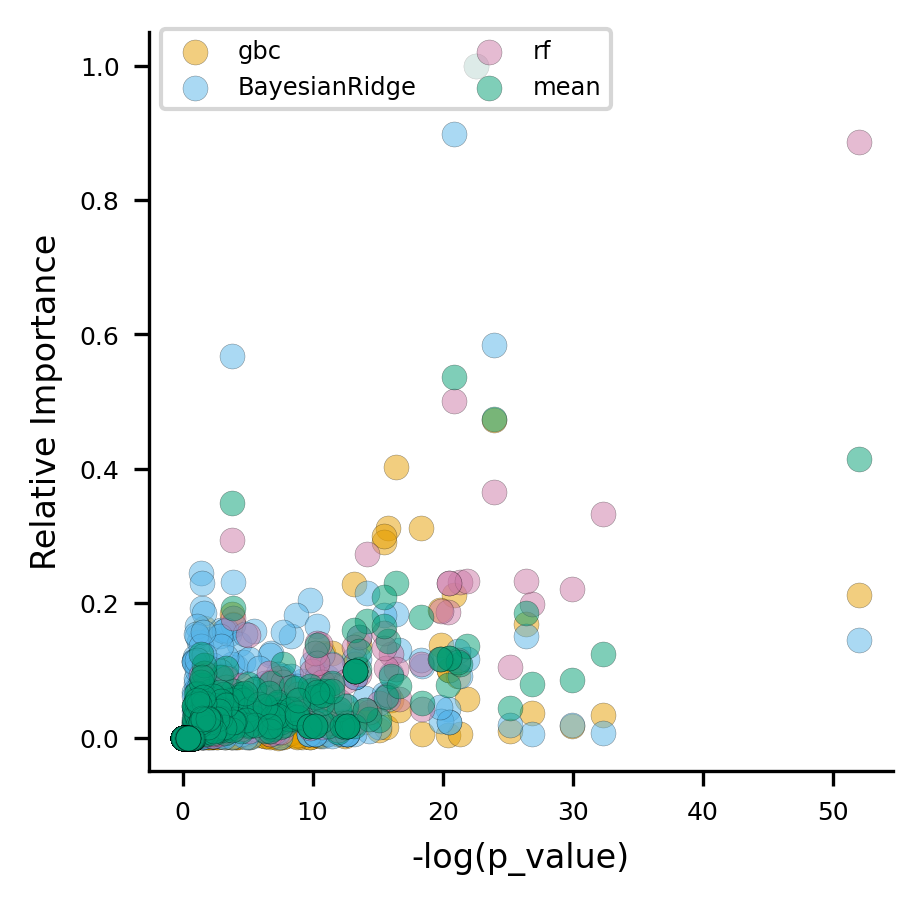

In [107]:
scatter_plot = plot_scatter(summary_result=sr, report_dir=report_dir)

In [108]:
%%time
mean_imp = mean_importance(top, report_dir=report_dir)

CPU times: total: 734 ms
Wall time: 855 ms


mean Done


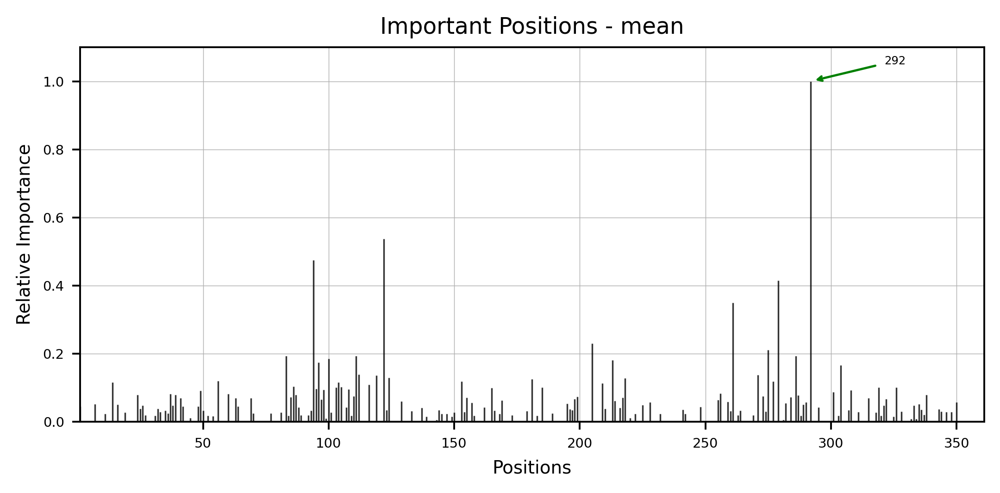

In [109]:
dp_plot(importance=mean_imp,imp_col='mean', model_name='mean', report_dir=report_dir)

In [110]:
tr = prep_pipeline[:4].fit_transform(tr)

gbc Done
gbc  Done
BayesianRidge Done
BayesianRidge  Done
rf Done
rf  Done


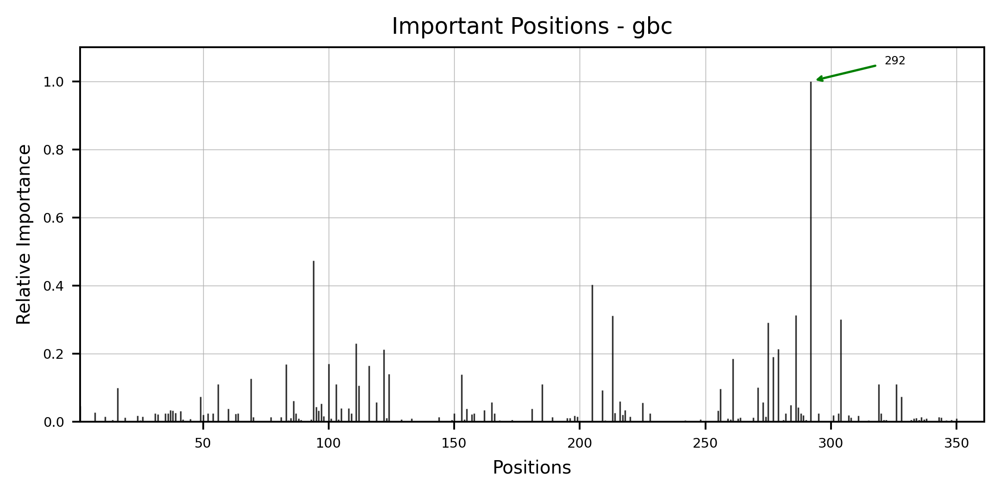

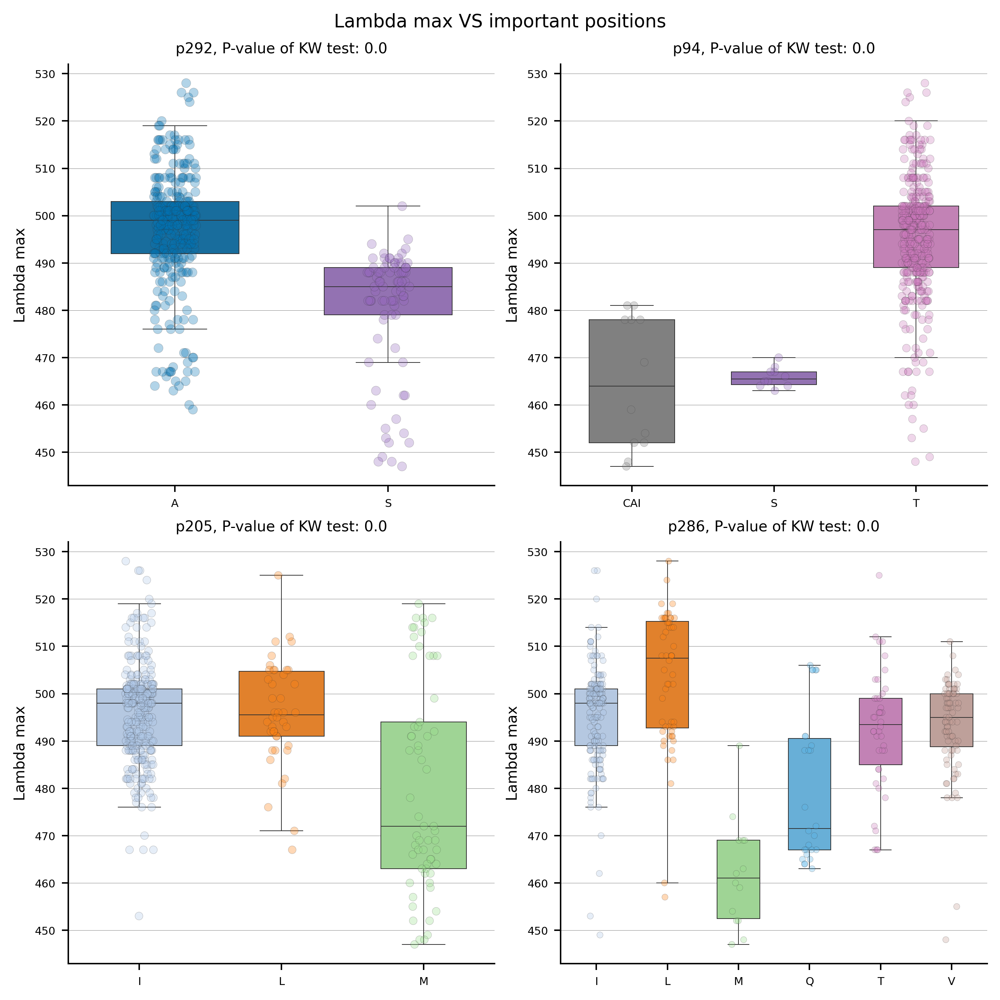

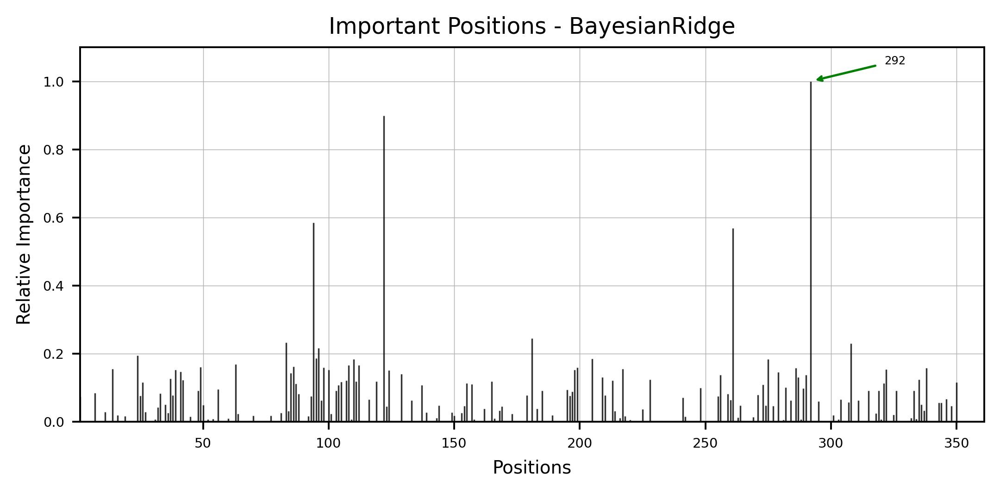

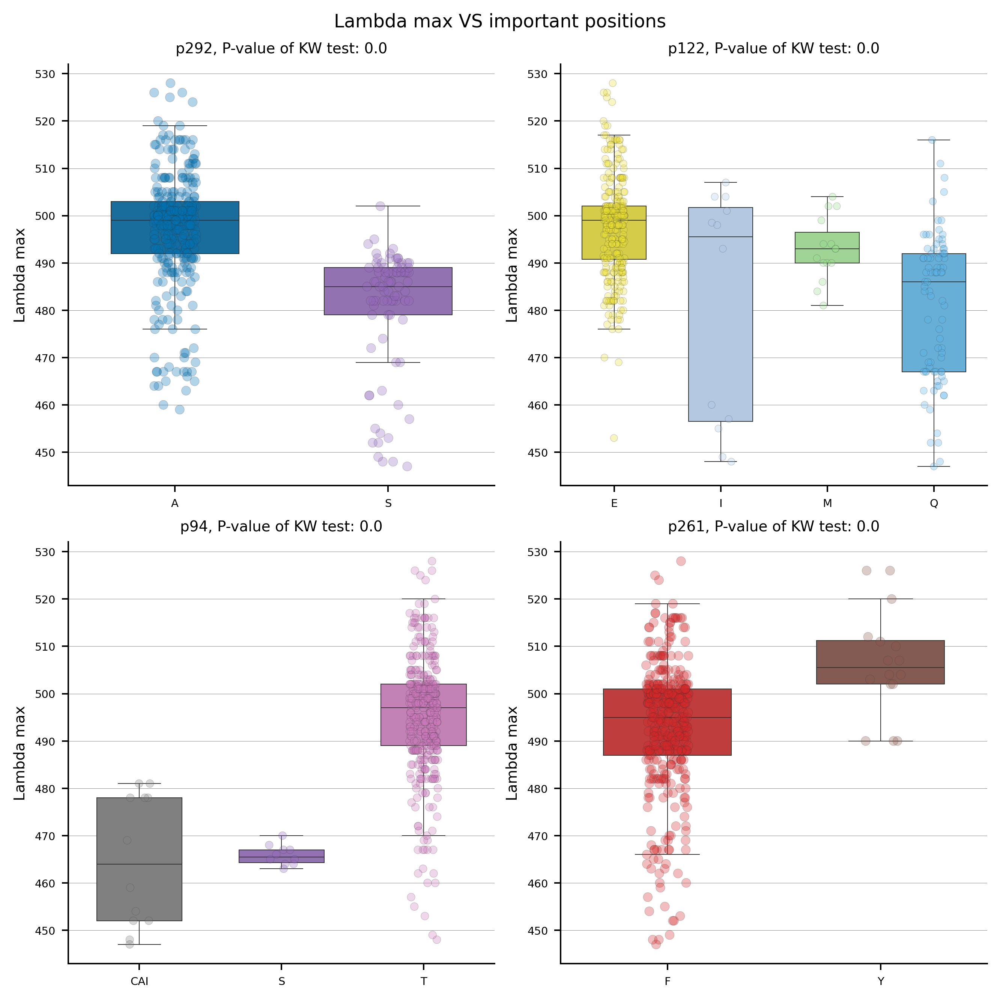

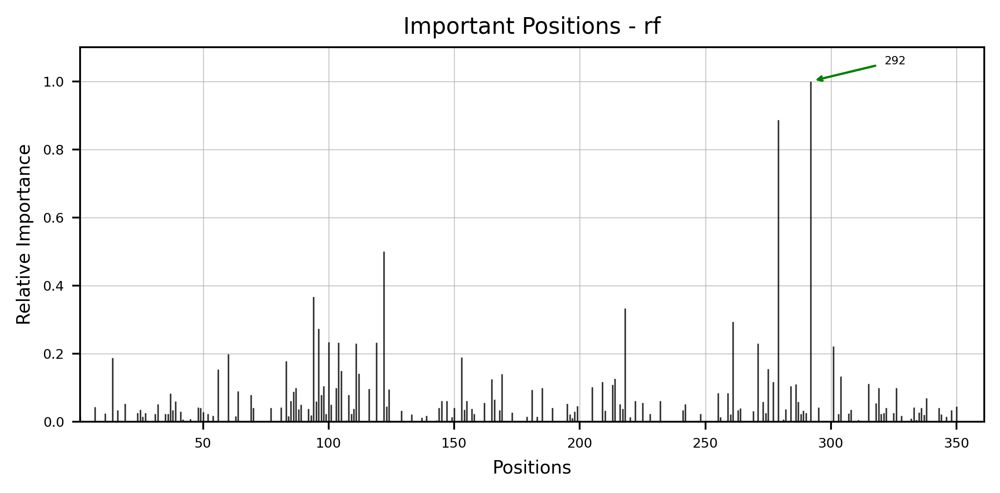

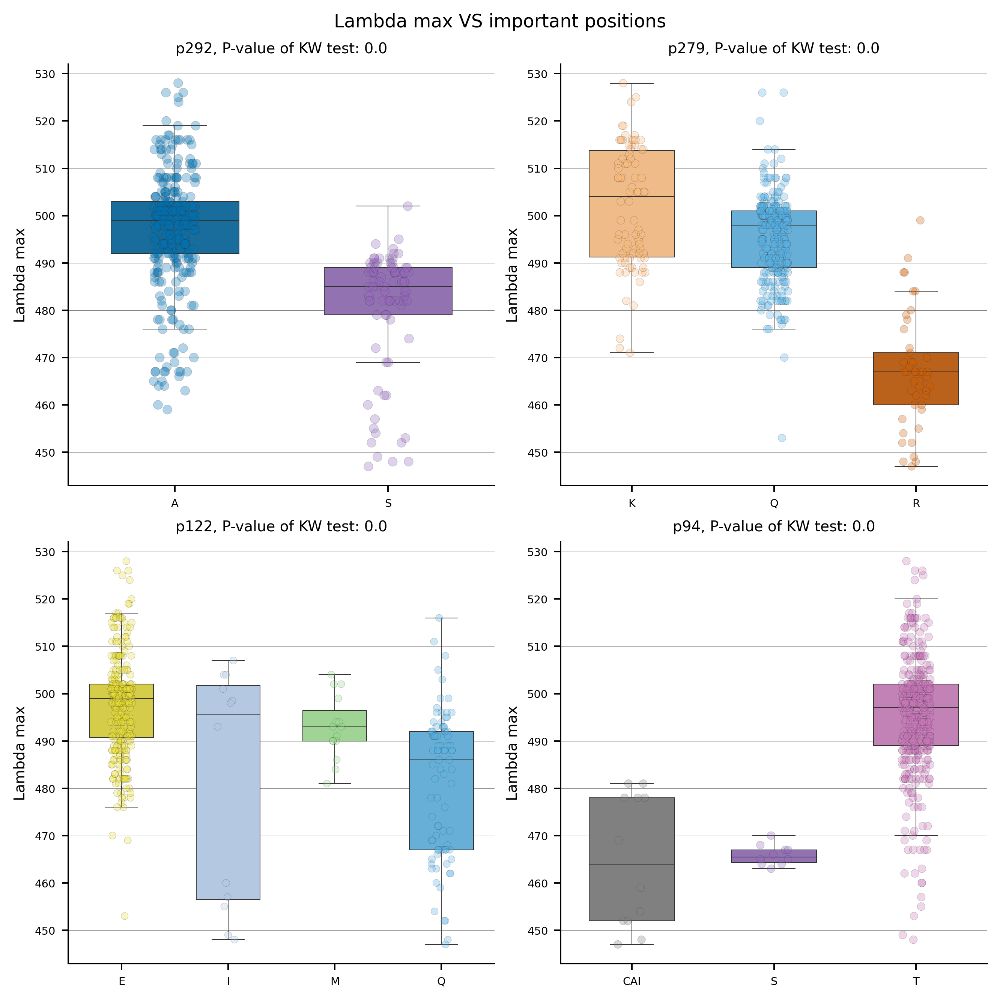

In [111]:
for model in top:
    model_name = model.steps[-1][0]
    dp_plot(importance=importance_from_pipe(model, aggregate_function='max'),
            imp_col='standard_value',
            model_name = model_name, report_dir=report_dir)
    
    plot_imp_model(importance=importance_from_pipe(model),
                   X_train=tr, y_train=y, model_name=model_name,
                   meta_var='Lambda max', model_type=ana_type,
                   report_dir=report_dir)

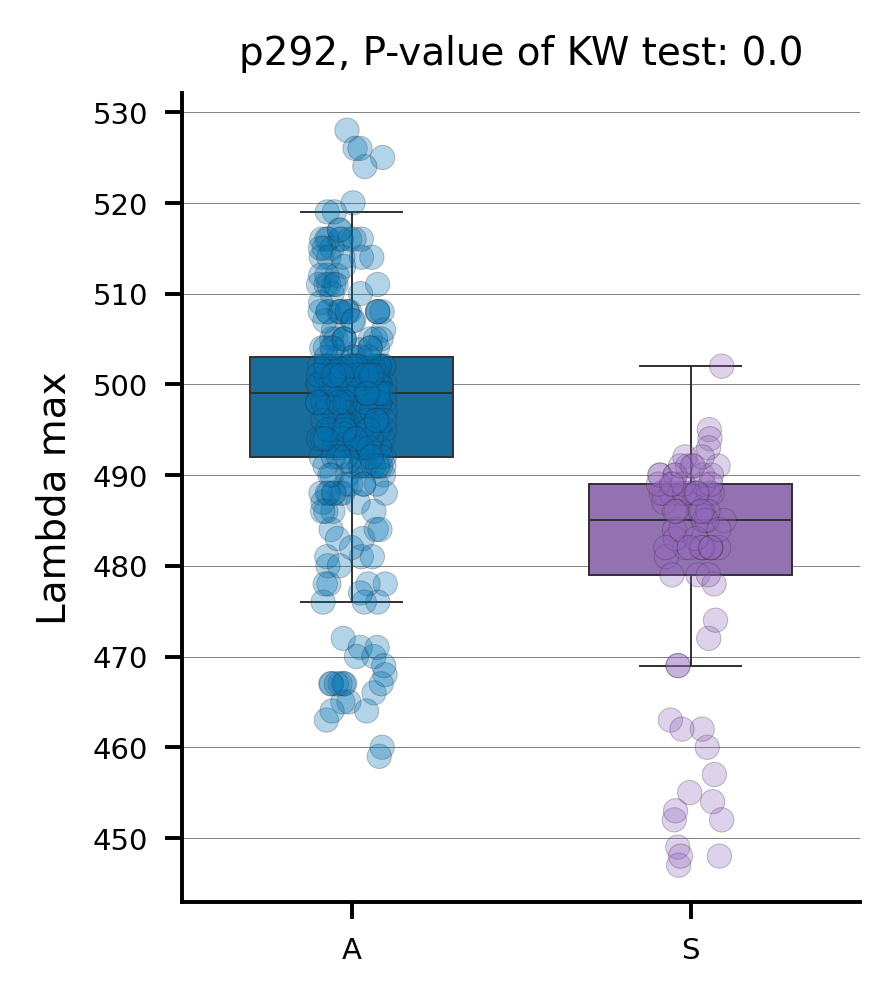

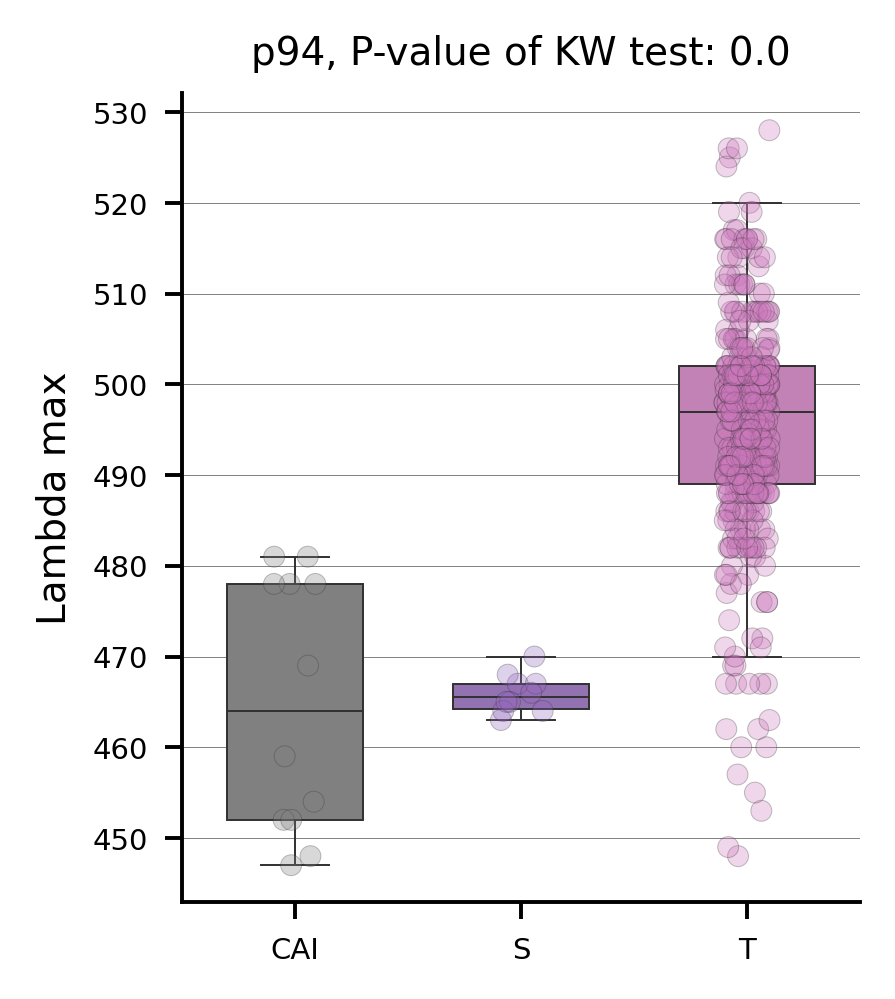

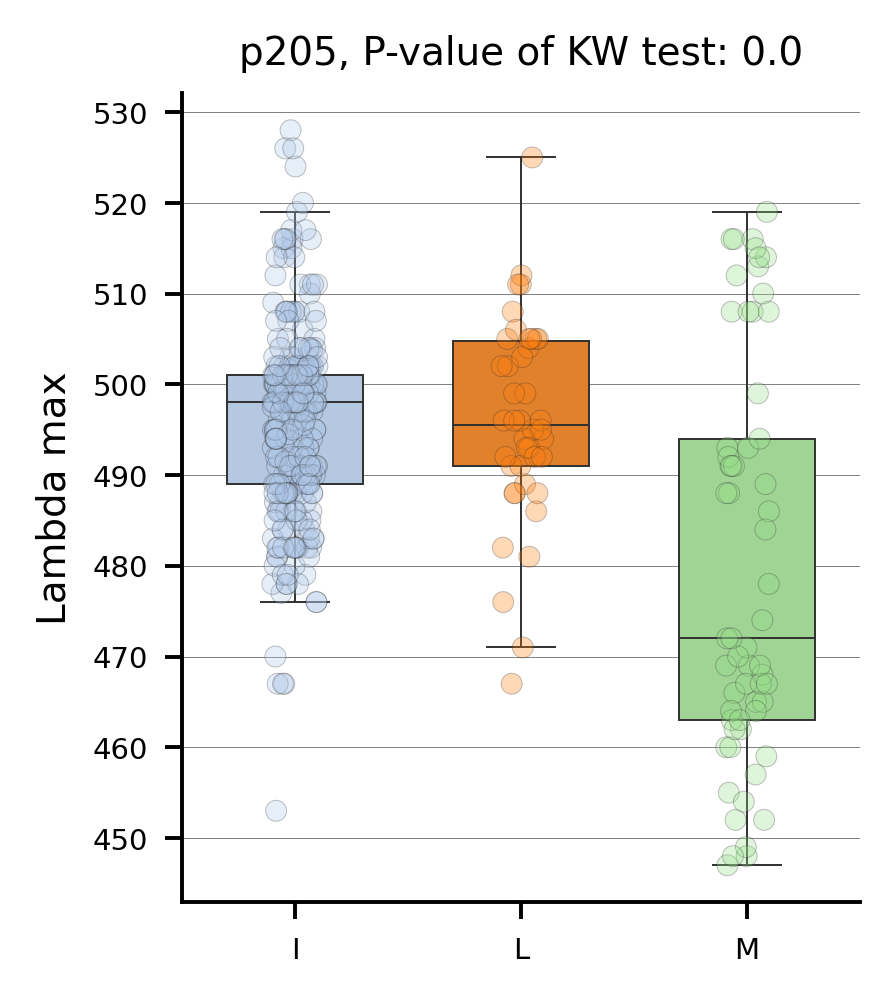

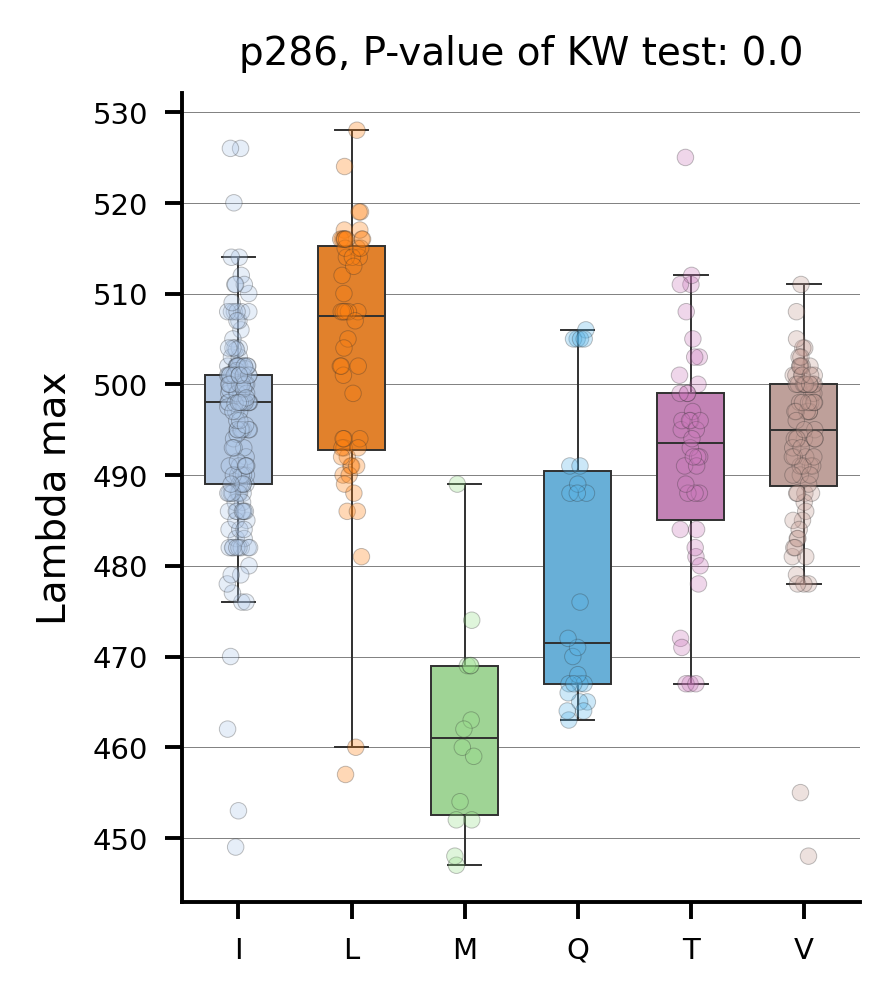

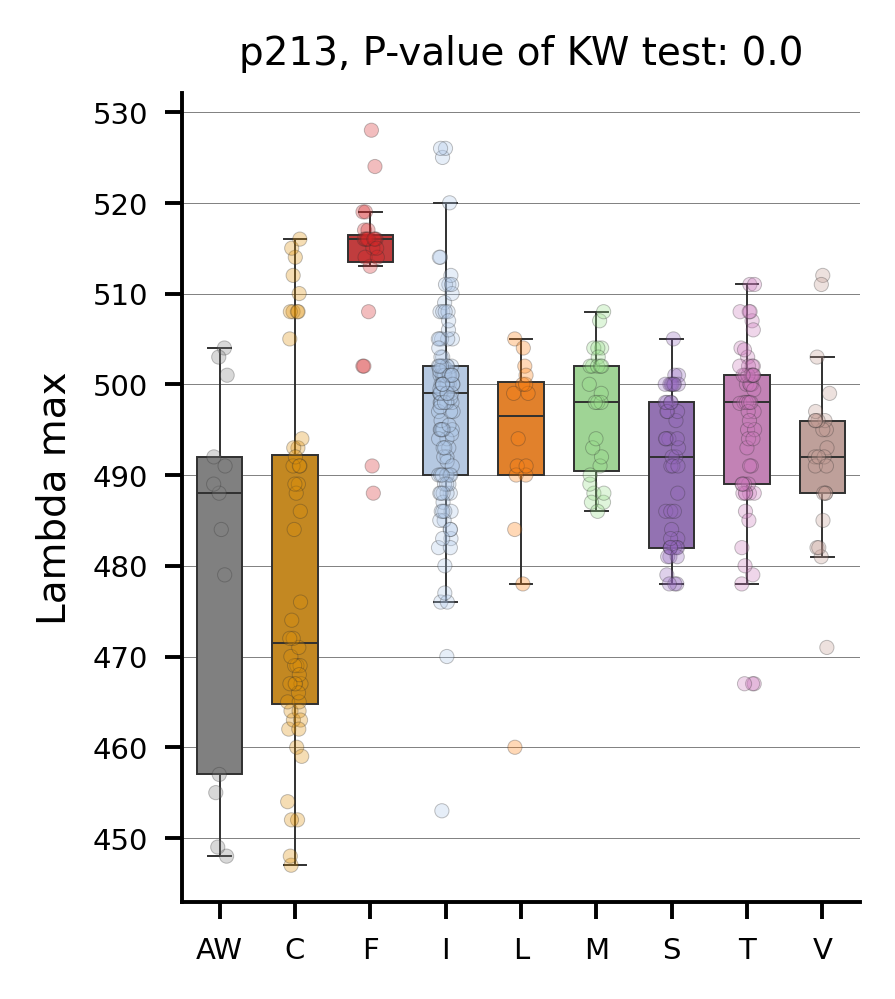

...

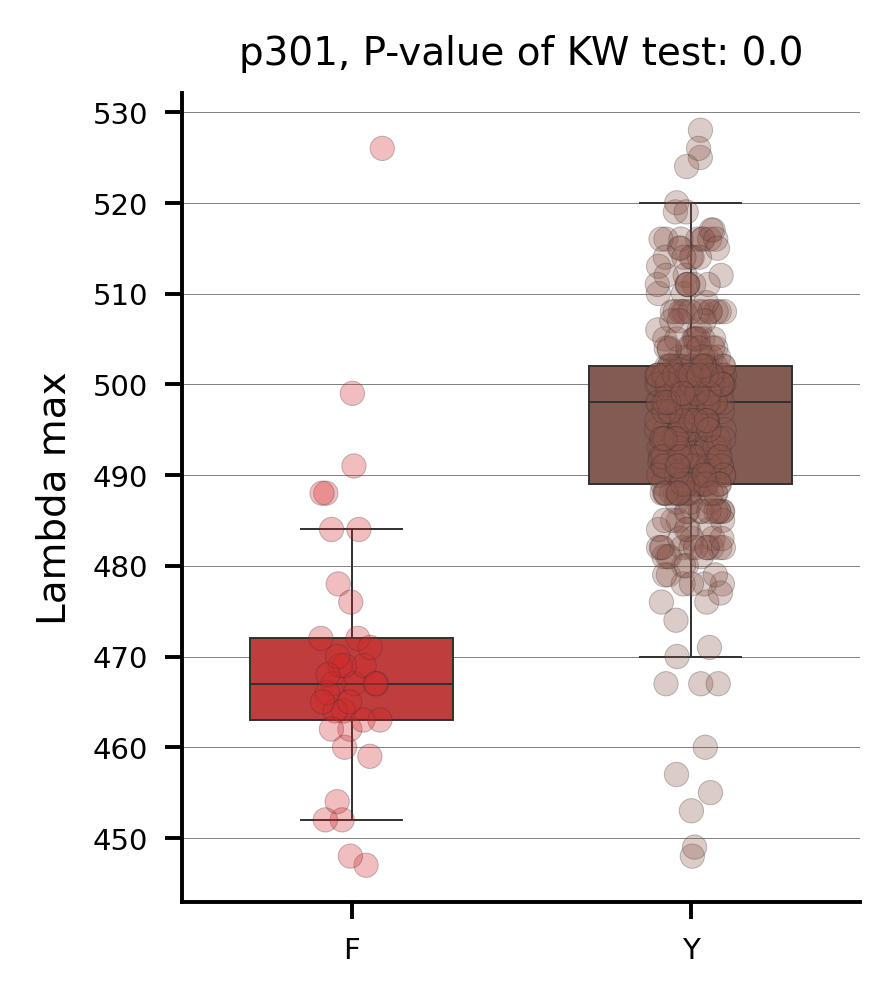

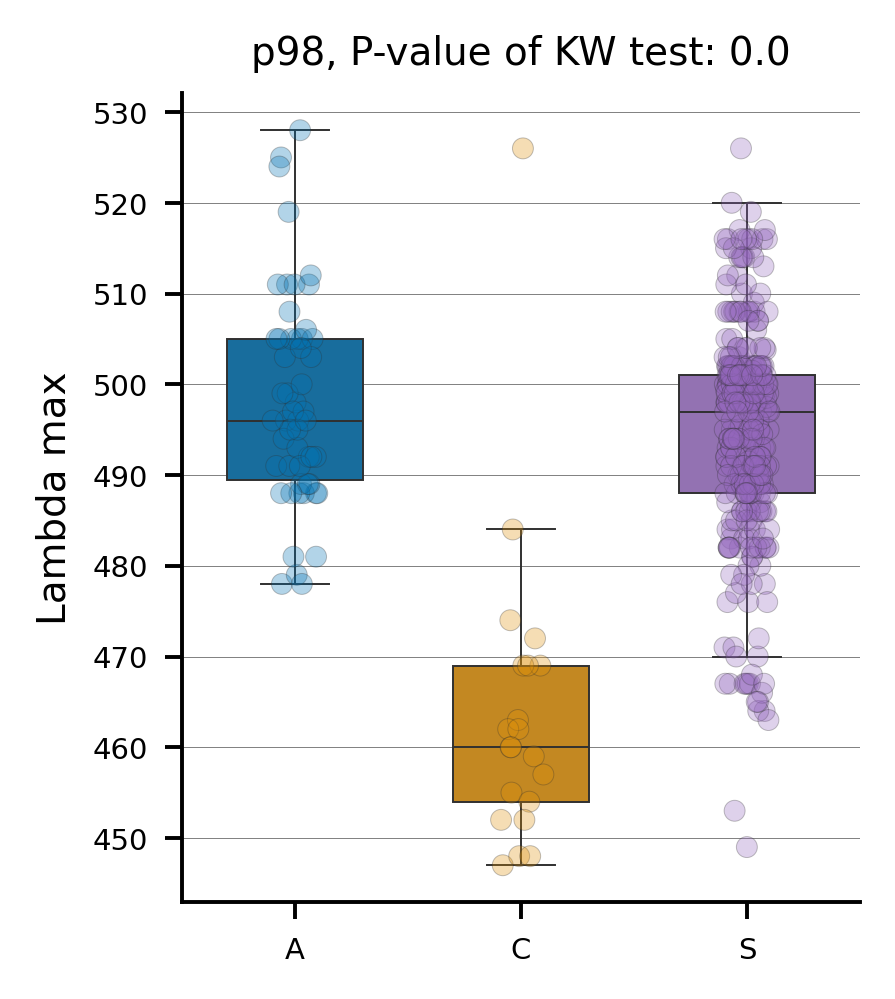

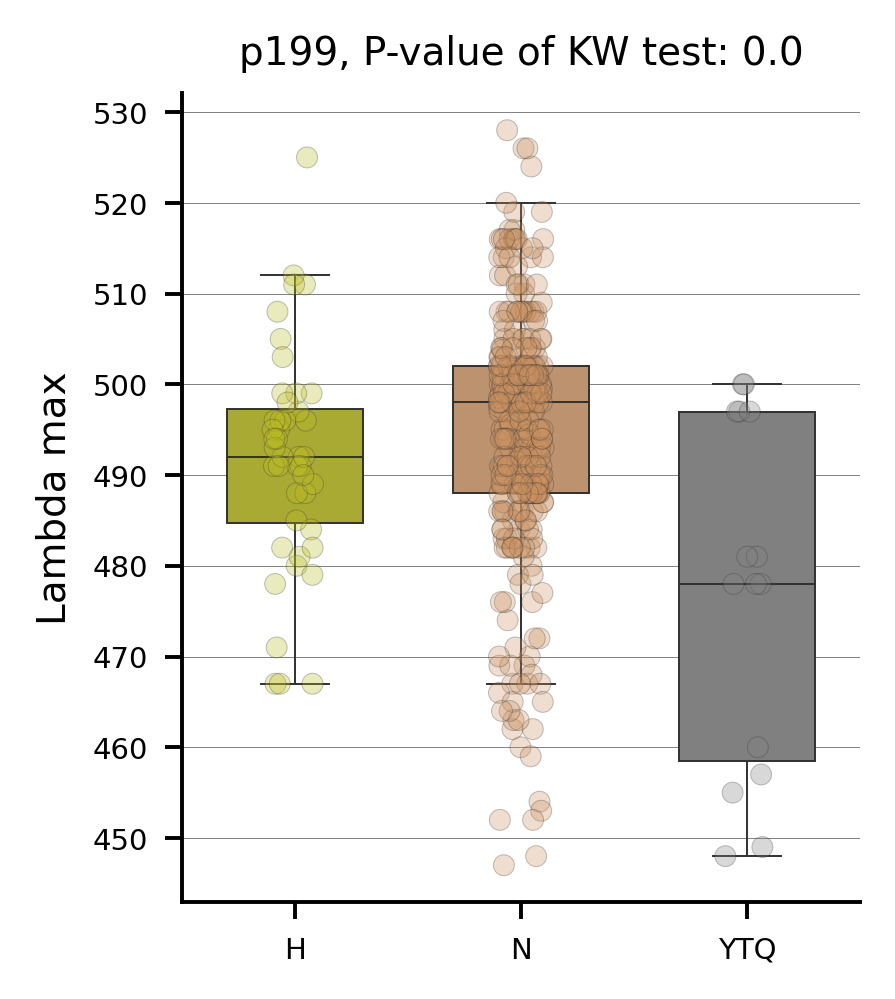

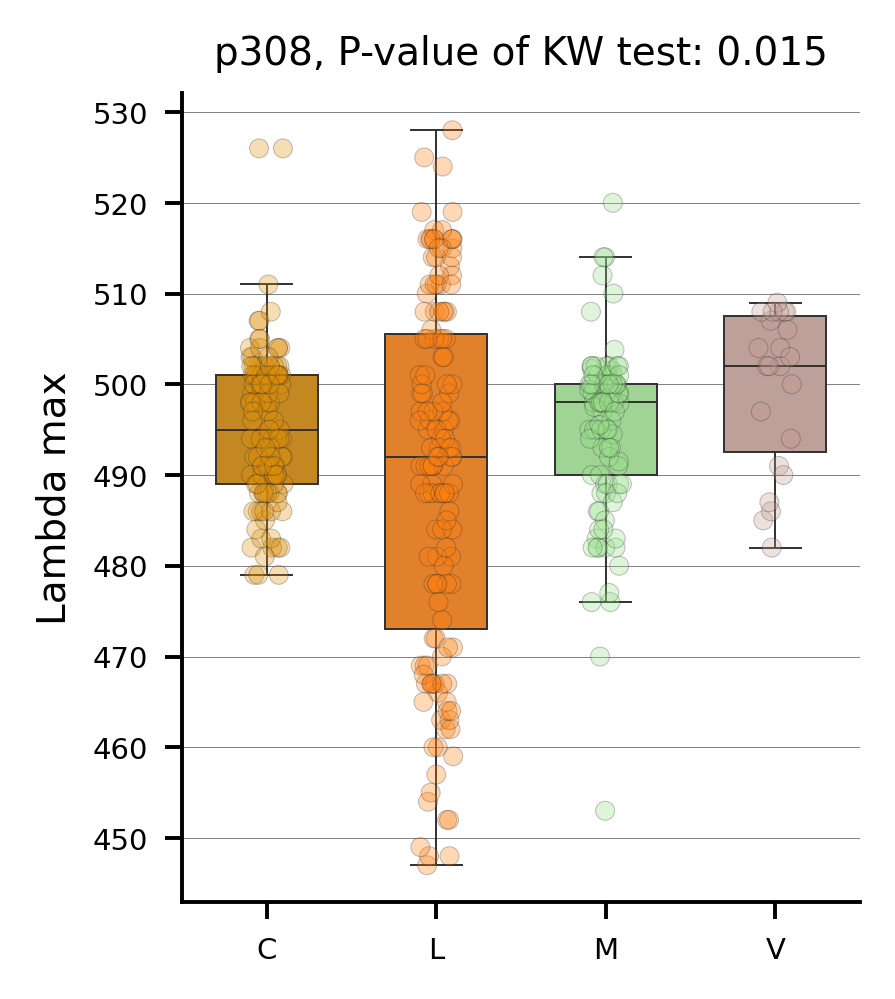

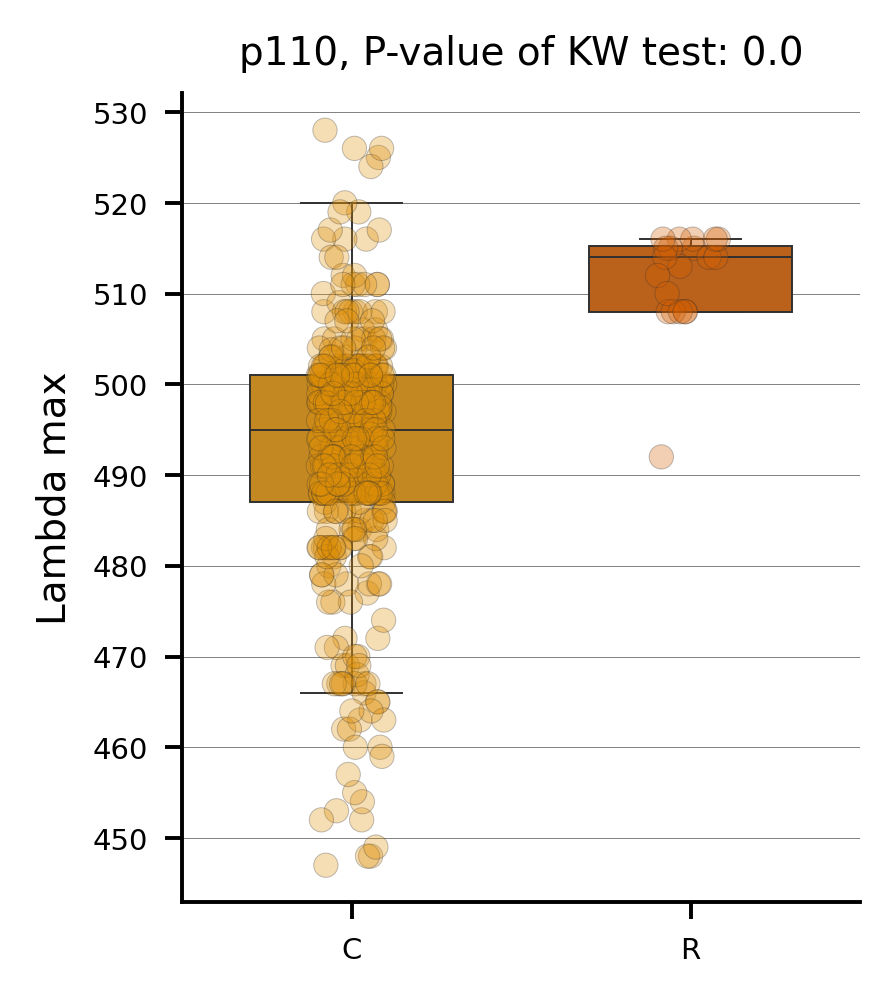

In [112]:
pl = plot_imp_all(final_models=top,
                  X_train=tr, y_train=y,
                  aggregate_function='max',
                  meta_var='Lambda max',
                  model_type = ana_type,
                  report_dir=report_dir, max_plots=100,
                  figsize=(2.5, 3))

In [113]:
# printing important positions with their importance values
positions = list(mean_imp.sort_values('mean', ascending=False)['feature'][:100])
importance = list(mean_imp.sort_values('mean', ascending=False)['mean'][:100].round(3))

ref_compare = None
ref_id = -1
compare_len = 30
imp_print(raw_seq, position=positions, importance=importance,
          ref_seq_id=ref_id, compare_with=ref_compare,
          compare_len=compare_len, report_dir=report_dir)